In [1]:
import numpy as np
from tqdm import tqdm
import torch
import pickle as pkl
from torch.nn.modules.module import Module
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import random
use_cuda = torch.cuda.is_available()
device = torch.device('cuda:6') if use_cuda else torch.device('cpu')
if torch.cuda.is_available() == True:
    torch.cuda.set_device(6)
import wandb

In [2]:

N2_self_rules = [85,90,102,153,165,150,195,204,240]
rules = [38,45,54,62,82,84,86]
rules.extend(N2_self_rules)
loss_F = torch.nn.NLLLoss()
NEAR_0 = 1e-10

In [16]:
rule = 150#153#90#85#rules[0]

with open(f'./data/CA/CA_data_{rule}.pkl','rb') as f:
    data = pkl.load(f)['histories']
histories = torch.tensor(data,dtype=torch.float)

valid_ratio = 0.2
batch_size = 64
space  = data.shape[-1]
group_size = 2
data = histories#[:,::group_size,:]

In [17]:
histories.shape

torch.Size([100, 180, 120])

In [18]:
data_x = data[:,:-group_size,:]#.reshape(-1,histories.shape[-1])
data_y = data[:,group_size:,:]#.reshape(-1,histories.shape[-1])

train_data_x = data_x[:int(0.6*data_x.shape[0]),:,:]
train_data_y = data_y[:int(0.6*data_y.shape[0]),:]
valid_data_x = data_x[int(0.6*data_x.shape[0]):int(0.8*data_x.shape[0]),:,:]
valid_data_y = data_y[int(0.6*data_y.shape[0]):int(0.8*data_x.shape[0]),:,:]
test_data_x = data_x[int(0.8*data_x.shape[0]):,:,:]
test_data_y = data_y[int(0.8*data_y.shape[0]):,:,:]

dataset1 = torch.utils.data.dataset.TensorDataset(train_data_x, train_data_y)
dataset2 = torch.utils.data.dataset.TensorDataset(valid_data_x, valid_data_y)
dataset3 = torch.utils.data.dataset.TensorDataset(test_data_x, test_data_y)

train_loader = torch.utils.data.DataLoader(dataset=dataset1,
                                           batch_size=batch_size, 
                                           shuffle=False,
                                           drop_last=False)

valid_loader = torch.utils.data.DataLoader(dataset=dataset2,
                                           batch_size=batch_size, 
                                           shuffle=False,
                                           drop_last=False)
test_loader = torch.utils.data.DataLoader(dataset=dataset3,
                                           batch_size=batch_size, 
                                           shuffle=False,
                                           drop_last=False)

In [19]:
train_data_x.shape, train_data_y.shape,valid_data_x.shape

(torch.Size([60, 178, 120]),
 torch.Size([60, 178, 120]),
 torch.Size([20, 178, 120]))

In [20]:
len(train_loader),len(train_loader)

(1, 1)

In [21]:

class DynamicLearner(nn.Module):
    def __init__(self,channel=3,hidden_dim=8):
        super(DynamicLearner, self).__init__()
        hidden_dim = hidden_dim
#         channel = channel
        self.dynamic_learner1 = nn.Sequential(
            nn.Conv1d(1, channel, 3, padding=1, padding_mode='circular'),
            nn.ReLU(),
        )
        self.dynamic_learner2 = nn.Sequential(
            nn.Linear(channel,2),
            nn.ReLU()
        )
    def forward(self, x):
        x = self.dynamic_learner1(x.unsqueeze(1))
        x = torch.transpose(x,2,1)
        x = self.dynamic_learner2(x)
        x = F.softmax(x,dim=2)
        return x
# 粗粒化过程
class RenormNet(nn.Module):
    def __init__(self,node_size,group_size):
        super(RenormNet, self).__init__()
        channel=3
        self.encoder = nn.Sequential(
            nn.Conv2d(1, channel, group_size, stride=group_size),
            nn.LeakyReLU(),

        )
        self.network1 = nn.Sequential(

            nn.Linear(channel, 2),
            nn.LeakyReLU()
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(1, channel, group_size, stride=group_size),
            nn.LeakyReLU(),

        )
        self.network2 = nn.Sequential(
            nn.Linear(channel,2),
            nn.LeakyReLU(),

        )
        
    def forward(self, x):
        return x
    
    def Encoder(self,x):
        encoder = self.encoder(x.unsqueeze(1))#.squeeze(0)
        encoder = encoder.permute(0,2,3,1)
        encoder = self.network1(encoder)#.squeeze(2)
        encoder = F.softmax(encoder,dim=-1)
        return encoder
    
    def Decoder(self,x):
        x = self.decoder(x.unsqueeze(1))
        x = x.permute(0,2,3,1)
        x = self.network2(x)#.squeeze()
        decoder = F.gumbel_softmax(x,dim=-1,hard=True)
        return decoder
    
def init_weight(layer):
    if type(layer)==nn.Conv2d or type(layer)==nn.ConvTranspose2d or type(layer) == nn.Linear:
        nn.init.uniform_(layer.weight, a=0.0, b=1)
        
    

In [22]:
dynamic = torch.load(f'./models/{rule}_dynamic.pth',map_location=torch.device('cpu'))

In [23]:
hidden_size = 128
seed = 2053

random.seed(seed)

In [24]:
train_data_x.shape,valid_data_x.shape,

(torch.Size([60, 178, 120]), torch.Size([20, 178, 120]))

In [25]:
NEAR_ZERO=1e-10

  0%|                                                 | 0/10000 [00:00<?, ?it/s]/opt/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


epoch: 0/10000,train loss:11.83526,valid_loss:11.84322071
save


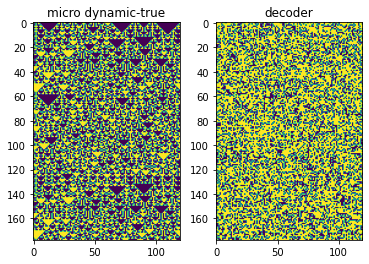

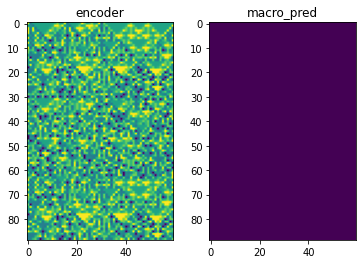

  0%|                                       | 1/10000 [00:00<1:57:40,  1.42it/s]

tensor([[0.5847, 0.5764],
        [0.5784, 0.5784]], grad_fn=<SelectBackward0>) tensor([[0.4628, 0.4628],
        [0.4628, 0.4628]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


  0%|                                        | 21/10000 [00:06<46:57,  3.54it/s]

epoch: 20/10000,train loss:11.81812,valid_loss:11.83147144
save


  0%|▏                                       | 41/10000 [00:11<46:27,  3.57it/s]

epoch: 40/10000,train loss:11.79432,valid_loss:11.80786324
save


  1%|▏                                       | 61/10000 [00:16<48:49,  3.39it/s]

epoch: 60/10000,train loss:11.75725,valid_loss:11.77875710
save


  1%|▎                                       | 81/10000 [00:22<45:59,  3.59it/s]

epoch: 80/10000,train loss:11.73226,valid_loss:11.72421074
save


  1%|▍                                      | 100/10000 [00:27<43:09,  3.82it/s]

epoch: 100/10000,train loss:11.71181,valid_loss:11.71003628
save


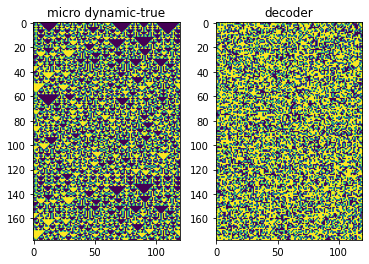

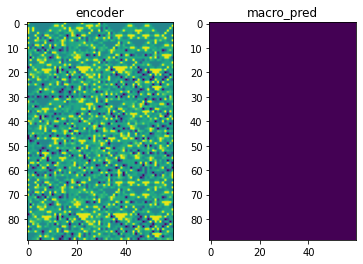

  1%|▍                                      | 101/10000 [00:28<57:31,  2.87it/s]

tensor([[0.5899, 0.5834],
        [0.5831, 0.5831]], grad_fn=<SelectBackward0>) tensor([[0.4628, 0.4628],
        [0.4628, 0.4628]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 1.],
        [0., 1., 0.],
        [0., 1., 0.]], grad_fn=<SelectBackward0>)


  1%|▍                                      | 121/10000 [00:33<44:59,  3.66it/s]

epoch: 120/10000,train loss:11.68808,valid_loss:11.65991020
save


  1%|▌                                      | 141/10000 [00:38<44:39,  3.68it/s]

epoch: 140/10000,train loss:11.65757,valid_loss:11.65522003
save


  2%|▋                                      | 161/10000 [00:43<46:22,  3.54it/s]

epoch: 160/10000,train loss:11.61460,valid_loss:11.59846306
save


  2%|▋                                      | 181/10000 [00:49<44:40,  3.66it/s]

epoch: 180/10000,train loss:11.56745,valid_loss:11.58380222
save


  2%|▊                                      | 200/10000 [00:54<42:19,  3.86it/s]

epoch: 200/10000,train loss:11.55145,valid_loss:11.53448486
save


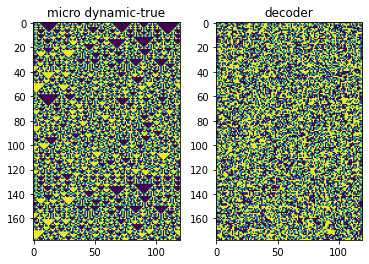

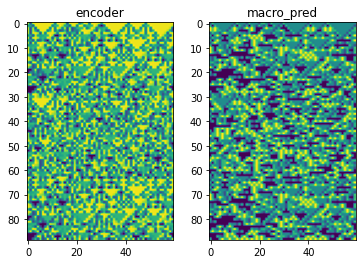

  2%|▊                                      | 201/10000 [00:54<56:46,  2.88it/s]

tensor([[0.5222, 0.3448],
        [0.4382, 0.4382]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 0., 1.],
        [0., 1., 0.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


  2%|▊                                      | 221/10000 [00:59<44:46,  3.64it/s]

epoch: 220/10000,train loss:11.50240,valid_loss:11.51632023
save


  2%|▉                                      | 241/10000 [01:05<44:13,  3.68it/s]

epoch: 240/10000,train loss:11.48017,valid_loss:11.46878052
save


  3%|█                                      | 261/10000 [01:10<44:18,  3.66it/s]

epoch: 260/10000,train loss:11.47175,valid_loss:11.45363522
save


  3%|█                                      | 281/10000 [01:15<44:01,  3.68it/s]

epoch: 280/10000,train loss:11.42360,valid_loss:11.39148998
save


  3%|█▏                                     | 300/10000 [01:20<41:41,  3.88it/s]

epoch: 300/10000,train loss:11.40417,valid_loss:11.39661026


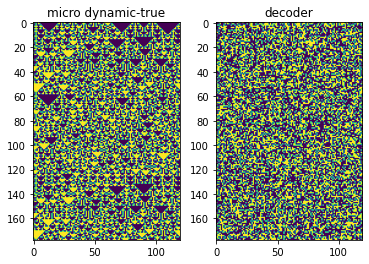

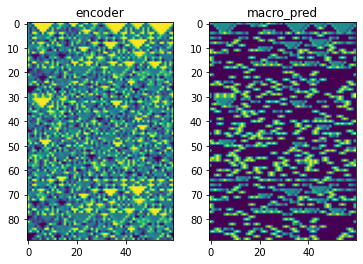

  3%|█▏                                     | 301/10000 [01:20<55:43,  2.90it/s]

tensor([[0.3637, 0.2006],
        [0.3301, 0.3301]], grad_fn=<SelectBackward0>) tensor([[0.5910, 0.6201],
        [0.0462, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 0., 1.],
        [0., 0., 0.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


  3%|█▎                                     | 321/10000 [01:26<44:50,  3.60it/s]

epoch: 320/10000,train loss:11.38236,valid_loss:11.38459015
save


  3%|█▎                                     | 341/10000 [01:31<44:56,  3.58it/s]

epoch: 340/10000,train loss:11.40241,valid_loss:11.40280914


  4%|█▍                                     | 361/10000 [01:36<44:00,  3.65it/s]

epoch: 360/10000,train loss:11.37018,valid_loss:11.36599445
save


  4%|█▍                                     | 381/10000 [01:42<44:07,  3.63it/s]

epoch: 380/10000,train loss:11.36310,valid_loss:11.38189507


  4%|█▌                                     | 400/10000 [01:46<41:08,  3.89it/s]

epoch: 400/10000,train loss:11.35026,valid_loss:11.33020687
save


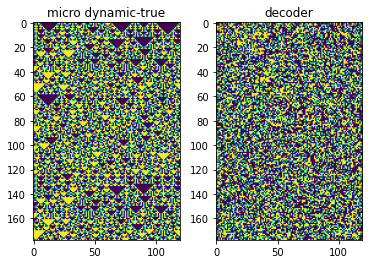

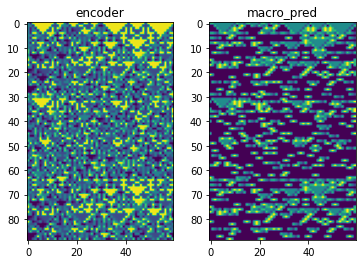

  4%|█▌                                     | 401/10000 [01:47<55:32,  2.88it/s]

tensor([[0.3007, 0.1415],
        [0.3136, 0.3136]], grad_fn=<SelectBackward0>) tensor([[0.5910, 0.6201],
        [0.0462, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]], grad_fn=<SelectBackward0>)


  4%|█▋                                     | 421/10000 [01:52<43:50,  3.64it/s]

epoch: 420/10000,train loss:11.34104,valid_loss:11.33371067


  4%|█▋                                     | 441/10000 [01:58<45:46,  3.48it/s]

epoch: 440/10000,train loss:11.34235,valid_loss:11.34529686


  5%|█▊                                     | 461/10000 [02:03<43:55,  3.62it/s]

epoch: 460/10000,train loss:11.34165,valid_loss:11.30956364
save


  5%|█▉                                     | 481/10000 [02:08<43:20,  3.66it/s]

epoch: 480/10000,train loss:11.33191,valid_loss:11.36885166


  5%|█▉                                     | 500/10000 [02:13<40:39,  3.89it/s]

epoch: 500/10000,train loss:11.34169,valid_loss:11.36906719


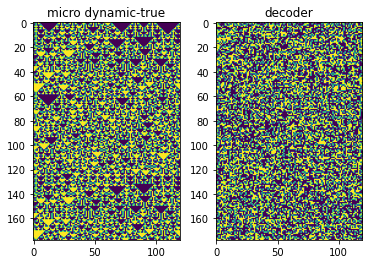

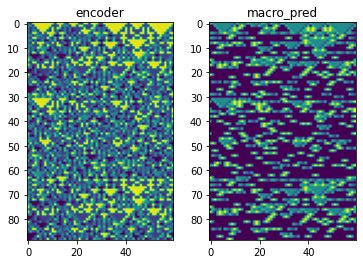

  5%|█▉                                     | 501/10000 [02:14<59:31,  2.66it/s]

tensor([[0.3048, 0.1413],
        [0.3500, 0.3500]], grad_fn=<SelectBackward0>) tensor([[0.5910, 0.6201],
        [0.0462, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 1., 1.],
        [0., 1., 0.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


  5%|██                                     | 521/10000 [02:19<43:06,  3.66it/s]

epoch: 520/10000,train loss:11.33179,valid_loss:11.36545563


  5%|██                                     | 541/10000 [02:24<43:57,  3.59it/s]

epoch: 540/10000,train loss:11.34125,valid_loss:11.34599876


  6%|██▏                                    | 561/10000 [02:29<42:46,  3.68it/s]

epoch: 560/10000,train loss:11.32356,valid_loss:11.33979988


  6%|██▎                                    | 581/10000 [02:35<43:03,  3.65it/s]

epoch: 580/10000,train loss:11.33729,valid_loss:11.35397625


  6%|██▎                                    | 600/10000 [02:40<41:07,  3.81it/s]

epoch: 600/10000,train loss:11.32915,valid_loss:11.33791351


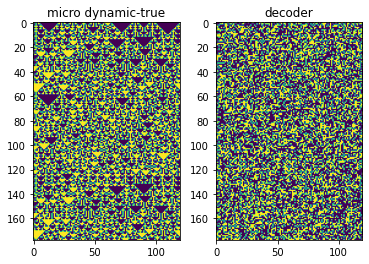

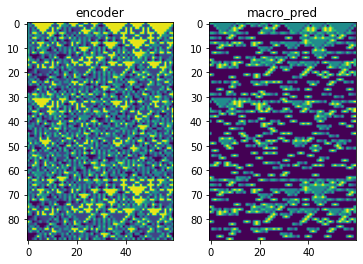

  6%|██▎                                    | 601/10000 [02:40<54:53,  2.85it/s]

tensor([[0.3605, 0.1472],
        [0.3467, 0.3467]], grad_fn=<SelectBackward0>) tensor([[0.5910, 0.6201],
        [0.0462, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 0., 0.],
        [0., 0., 0.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


  6%|██▍                                    | 621/10000 [02:45<42:38,  3.67it/s]

epoch: 620/10000,train loss:11.34435,valid_loss:11.33532619


  6%|██▍                                    | 641/10000 [02:51<42:49,  3.64it/s]

epoch: 640/10000,train loss:11.32940,valid_loss:11.34303284


  7%|██▌                                    | 661/10000 [02:56<42:24,  3.67it/s]

epoch: 660/10000,train loss:11.31499,valid_loss:11.33220005


  7%|██▋                                    | 681/10000 [03:01<46:18,  3.35it/s]

epoch: 680/10000,train loss:11.29314,valid_loss:11.30772972
save


  7%|██▋                                    | 700/10000 [03:07<44:42,  3.47it/s]

epoch: 700/10000,train loss:11.32536,valid_loss:11.30180168
save


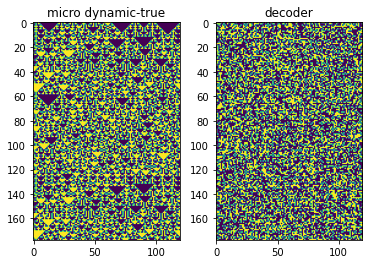

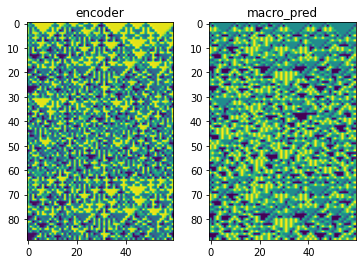

  7%|██▋                                    | 701/10000 [03:07<59:16,  2.61it/s]

tensor([[0.5819, 0.2584],
        [0.4514, 0.4514]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [1., 1., 1.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


  7%|██▊                                    | 721/10000 [03:12<43:45,  3.53it/s]

epoch: 720/10000,train loss:11.31659,valid_loss:11.28703308
save


  7%|██▉                                    | 741/10000 [03:18<44:08,  3.50it/s]

epoch: 740/10000,train loss:11.30719,valid_loss:11.27000046
save


  8%|██▉                                    | 761/10000 [03:23<45:18,  3.40it/s]

epoch: 760/10000,train loss:11.28755,valid_loss:11.28509140


  8%|███                                    | 781/10000 [03:29<46:16,  3.32it/s]

epoch: 780/10000,train loss:11.27219,valid_loss:11.24326515
save


  8%|███                                    | 800/10000 [03:34<40:07,  3.82it/s]

epoch: 800/10000,train loss:11.24785,valid_loss:11.18500137
save


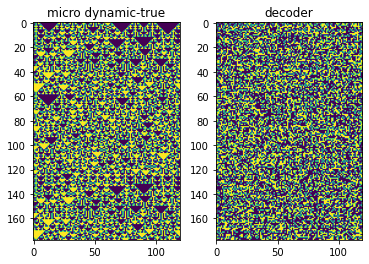

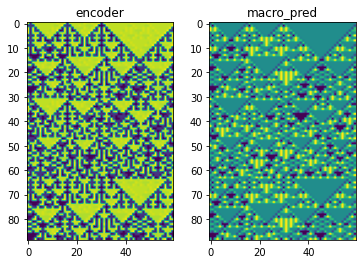

  8%|███                                    | 801/10000 [03:35<53:47,  2.85it/s]

tensor([[0.7659, 0.1521],
        [0.1953, 0.1953]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 1.],
        [1., 0., 0.],
        [0., 1., 0.]], grad_fn=<SelectBackward0>)


  8%|███▏                                   | 821/10000 [03:40<42:11,  3.63it/s]

epoch: 820/10000,train loss:11.23822,valid_loss:11.22100449


  8%|███▎                                   | 841/10000 [03:46<42:14,  3.61it/s]

epoch: 840/10000,train loss:11.22079,valid_loss:11.16942406
save


  9%|███▎                                   | 861/10000 [03:51<42:35,  3.58it/s]

epoch: 860/10000,train loss:11.20730,valid_loss:11.16554260
save


  9%|███▍                                   | 881/10000 [03:56<44:50,  3.39it/s]

epoch: 880/10000,train loss:11.18712,valid_loss:11.15524769
save


  9%|███▌                                   | 900/10000 [04:02<40:11,  3.77it/s]

epoch: 900/10000,train loss:11.17226,valid_loss:11.12872982
save


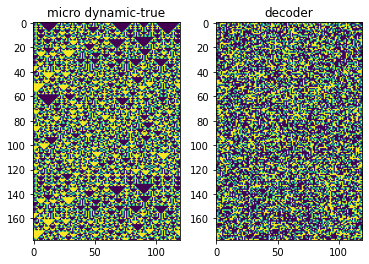

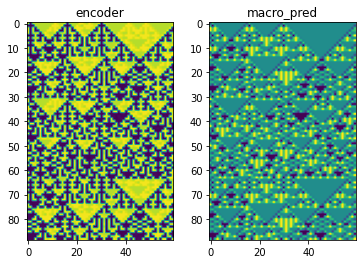

  9%|███▌                                   | 901/10000 [04:02<54:46,  2.77it/s]

tensor([[0.8912, 0.0724],
        [0.0657, 0.0657]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 1., 0.],
        [0., 0., 0.],
        [1., 1., 0.]], grad_fn=<SelectBackward0>)


  9%|███▌                                   | 921/10000 [04:08<43:12,  3.50it/s]

epoch: 920/10000,train loss:11.13473,valid_loss:11.11730289
save


  9%|███▋                                   | 941/10000 [04:14<44:32,  3.39it/s]

epoch: 940/10000,train loss:11.09997,valid_loss:11.10598469
save


 10%|███▋                                   | 961/10000 [04:19<44:42,  3.37it/s]

epoch: 960/10000,train loss:11.11026,valid_loss:11.09121609
save


 10%|███▊                                   | 981/10000 [04:25<47:35,  3.16it/s]

epoch: 980/10000,train loss:11.10009,valid_loss:11.08189106
save


 10%|███▊                                  | 1000/10000 [04:30<39:58,  3.75it/s]

epoch: 1000/10000,train loss:11.08195,valid_loss:11.05655766
save


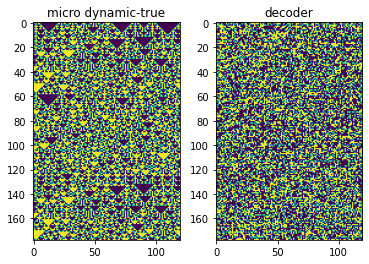

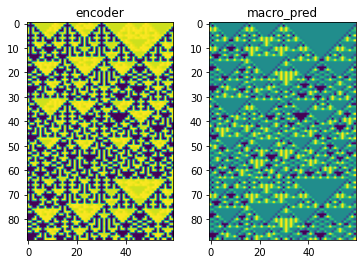

 10%|███▊                                  | 1001/10000 [04:31<59:33,  2.52it/s]

tensor([[0.9409, 0.0395],
        [0.0379, 0.0379]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 1., 1.],
        [0., 1., 0.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


 10%|███▉                                  | 1021/10000 [04:36<42:29,  3.52it/s]

epoch: 1020/10000,train loss:11.08597,valid_loss:11.04879665
save


 10%|███▉                                  | 1041/10000 [04:42<45:31,  3.28it/s]

epoch: 1040/10000,train loss:11.06277,valid_loss:11.04496956
save


 11%|████                                  | 1061/10000 [04:48<43:08,  3.45it/s]

epoch: 1060/10000,train loss:11.06146,valid_loss:11.05844593


 11%|████                                  | 1081/10000 [04:53<41:25,  3.59it/s]

epoch: 1080/10000,train loss:11.04531,valid_loss:11.05720520


 11%|████▏                                 | 1100/10000 [04:58<39:58,  3.71it/s]

epoch: 1100/10000,train loss:11.05108,valid_loss:11.04809570


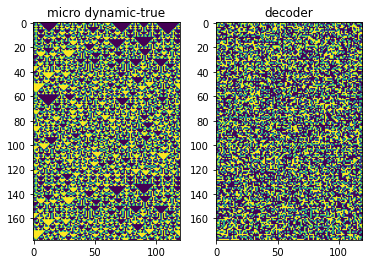

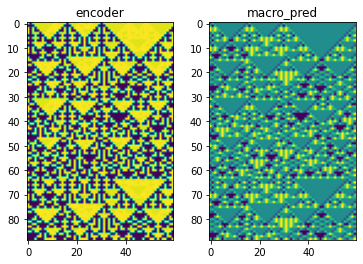

 11%|████▏                                 | 1101/10000 [04:59<53:18,  2.78it/s]

tensor([[0.9607, 0.0285],
        [0.0260, 0.0260]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 0., 0.],
        [0., 1., 1.],
        [1., 1., 0.]], grad_fn=<SelectBackward0>)


 11%|████▎                                 | 1121/10000 [05:04<40:47,  3.63it/s]

epoch: 1120/10000,train loss:11.04655,valid_loss:11.03106403
save


 11%|████▎                                 | 1141/10000 [05:10<42:55,  3.44it/s]

epoch: 1140/10000,train loss:11.03451,valid_loss:10.97420025
save


 12%|████▍                                 | 1161/10000 [05:16<44:14,  3.33it/s]

epoch: 1160/10000,train loss:11.02260,valid_loss:10.97452354


 12%|████▍                                 | 1181/10000 [05:22<52:35,  2.79it/s]

epoch: 1180/10000,train loss:10.99330,valid_loss:10.96304226
save


 12%|████▌                                 | 1200/10000 [05:28<47:48,  3.07it/s]

epoch: 1200/10000,train loss:10.99008,valid_loss:10.96304321


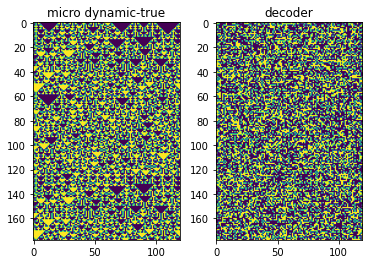

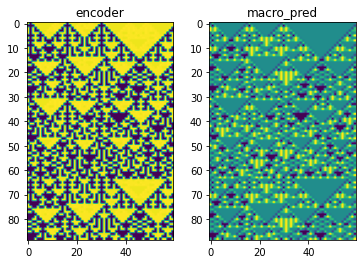

 12%|████▎                               | 1201/10000 [05:29<1:05:21,  2.24it/s]

tensor([[0.9671, 0.0195],
        [0.0199, 0.0199]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [1., 1., 1.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


 12%|████▋                                 | 1221/10000 [05:35<43:02,  3.40it/s]

epoch: 1220/10000,train loss:10.95882,valid_loss:11.00039577


 12%|████▋                                 | 1241/10000 [05:40<40:43,  3.59it/s]

epoch: 1240/10000,train loss:10.95794,valid_loss:10.97630119


 13%|████▊                                 | 1261/10000 [05:47<45:22,  3.21it/s]

epoch: 1260/10000,train loss:10.96423,valid_loss:10.92908573
save


 13%|████▊                                 | 1281/10000 [05:54<41:11,  3.53it/s]

epoch: 1280/10000,train loss:10.95336,valid_loss:10.90617943
save


 13%|████▉                                 | 1300/10000 [06:00<49:46,  2.91it/s]

epoch: 1300/10000,train loss:10.93616,valid_loss:10.91210747


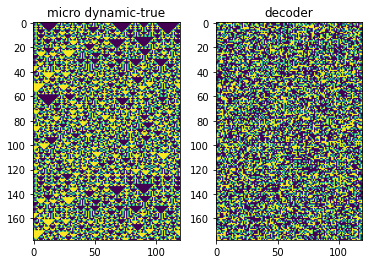

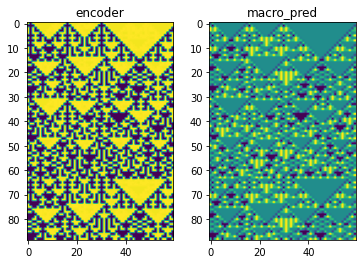

 13%|████▋                               | 1301/10000 [06:01<1:00:26,  2.40it/s]

tensor([[0.9748, 0.0148],
        [0.0150, 0.0150]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [0., 0., 1.],
        [0., 1., 0.]], grad_fn=<SelectBackward0>)


 13%|█████                                 | 1321/10000 [06:06<41:11,  3.51it/s]

epoch: 1320/10000,train loss:10.92544,valid_loss:10.91954613


 13%|█████                                 | 1341/10000 [06:12<39:32,  3.65it/s]

epoch: 1340/10000,train loss:10.91247,valid_loss:10.90952015


 14%|█████▏                                | 1361/10000 [06:17<43:54,  3.28it/s]

epoch: 1360/10000,train loss:10.91622,valid_loss:10.91685009


 14%|█████▏                                | 1381/10000 [06:23<48:34,  2.96it/s]

epoch: 1380/10000,train loss:10.90341,valid_loss:10.89071083
save


 14%|█████▎                                | 1400/10000 [06:29<39:36,  3.62it/s]

epoch: 1400/10000,train loss:10.88907,valid_loss:10.86203575
save


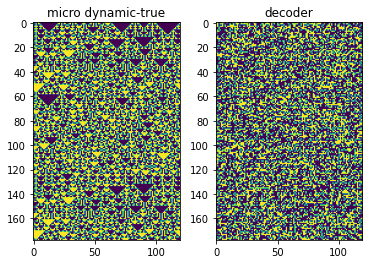

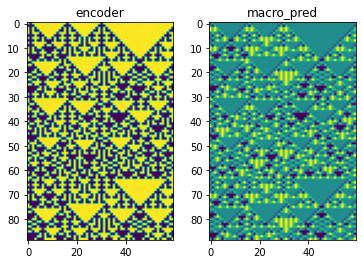

 14%|█████▎                                | 1401/10000 [06:30<53:12,  2.69it/s]

tensor([[0.9799, 0.0111],
        [0.0114, 0.0114]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 1., 0.],
        [1., 1., 0.],
        [1., 1., 0.]], grad_fn=<SelectBackward0>)


 14%|█████▍                                | 1421/10000 [06:35<40:14,  3.55it/s]

epoch: 1420/10000,train loss:10.89123,valid_loss:10.87734318


 14%|█████▍                                | 1441/10000 [06:41<49:50,  2.86it/s]

epoch: 1440/10000,train loss:10.87627,valid_loss:10.87949944


 15%|█████▌                                | 1461/10000 [06:48<44:03,  3.23it/s]

epoch: 1460/10000,train loss:10.87522,valid_loss:10.88019943


 15%|█████▋                                | 1481/10000 [06:54<45:34,  3.12it/s]

epoch: 1480/10000,train loss:10.86425,valid_loss:10.81093884
save


 15%|█████▋                                | 1500/10000 [06:59<43:18,  3.27it/s]

epoch: 1500/10000,train loss:10.84383,valid_loss:10.84845257


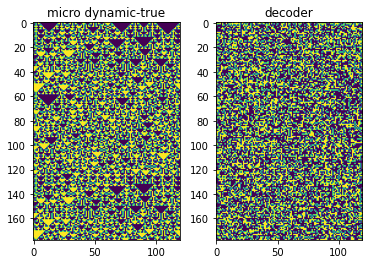

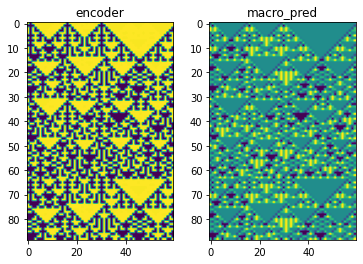

 15%|█████▍                              | 1501/10000 [07:00<1:06:58,  2.12it/s]

tensor([[0.9838, 0.0090],
        [0.0092, 0.0092]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 0., 0.],
        [1., 1., 1.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


 15%|█████▊                                | 1521/10000 [07:06<43:11,  3.27it/s]

epoch: 1520/10000,train loss:10.85302,valid_loss:10.82096291


 15%|█████▊                                | 1541/10000 [07:12<42:14,  3.34it/s]

epoch: 1540/10000,train loss:10.84259,valid_loss:10.86553860


 16%|█████▉                                | 1561/10000 [07:18<46:03,  3.05it/s]

epoch: 1560/10000,train loss:10.84574,valid_loss:10.82398129


 16%|██████                                | 1581/10000 [07:23<41:01,  3.42it/s]

epoch: 1580/10000,train loss:10.81662,valid_loss:10.80835056
save


 16%|██████                                | 1600/10000 [07:29<43:14,  3.24it/s]

epoch: 1600/10000,train loss:10.81746,valid_loss:10.82543755


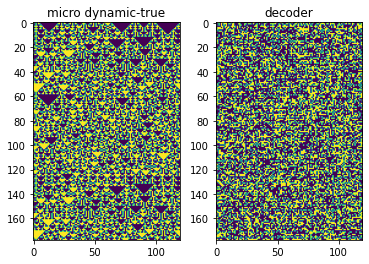

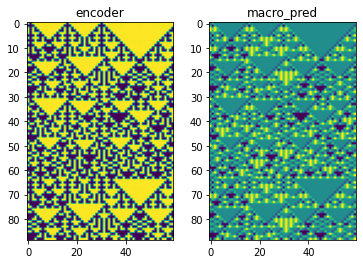

 16%|██████                                | 1601/10000 [07:30<55:35,  2.52it/s]

tensor([[0.9866, 0.0075],
        [0.0078, 0.0078]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 1., 1.],
        [0., 0., 1.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


 16%|██████▏                               | 1621/10000 [07:35<42:05,  3.32it/s]

epoch: 1620/10000,train loss:10.80643,valid_loss:10.80554867
save


 16%|██████▏                               | 1641/10000 [07:41<42:12,  3.30it/s]

epoch: 1640/10000,train loss:10.79709,valid_loss:10.79859638
save


 17%|██████▎                               | 1661/10000 [07:47<43:57,  3.16it/s]

epoch: 1660/10000,train loss:10.81011,valid_loss:10.81848335


 17%|██████▍                               | 1681/10000 [07:53<43:03,  3.22it/s]

epoch: 1680/10000,train loss:10.78685,valid_loss:10.78366566
save


 17%|██████▍                               | 1700/10000 [07:59<42:39,  3.24it/s]

epoch: 1700/10000,train loss:10.81543,valid_loss:10.78910828


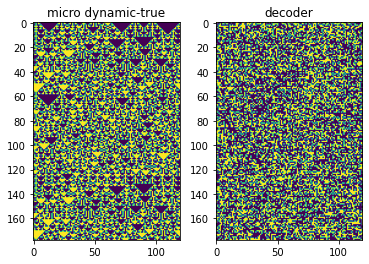

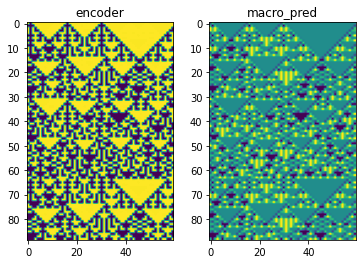

 17%|██████▍                               | 1701/10000 [08:00<56:32,  2.45it/s]

tensor([[0.9888, 0.0067],
        [0.0070, 0.0070]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 1., 0.],
        [0., 0., 0.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


 17%|██████▌                               | 1721/10000 [08:06<44:38,  3.09it/s]

epoch: 1720/10000,train loss:10.77177,valid_loss:10.80247498


 17%|██████▌                               | 1741/10000 [08:12<42:32,  3.24it/s]

epoch: 1740/10000,train loss:10.80032,valid_loss:10.80560112


 18%|██████▋                               | 1761/10000 [08:18<41:52,  3.28it/s]

epoch: 1760/10000,train loss:10.75316,valid_loss:10.78172398
save


 18%|██████▊                               | 1781/10000 [08:23<41:23,  3.31it/s]

epoch: 1780/10000,train loss:10.76575,valid_loss:10.76771069
save


 18%|██████▊                               | 1800/10000 [08:29<38:41,  3.53it/s]

epoch: 1800/10000,train loss:10.76643,valid_loss:10.72954941
save


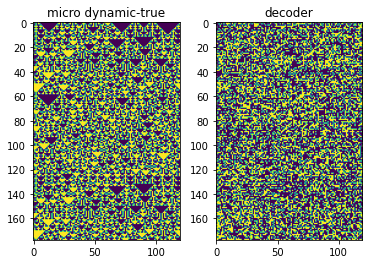

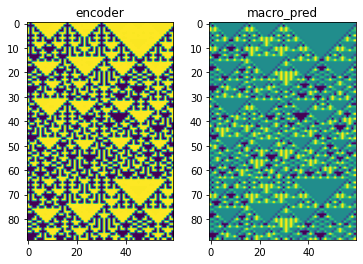

 18%|██████▊                               | 1801/10000 [08:29<51:55,  2.63it/s]

tensor([[0.9910, 0.0067],
        [0.0069, 0.0069]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [0., 0., 1.],
        [0., 0., 0.]], grad_fn=<SelectBackward0>)


 18%|██████▉                               | 1821/10000 [08:35<42:48,  3.18it/s]

epoch: 1820/10000,train loss:10.78871,valid_loss:10.74054623


 18%|██████▉                               | 1841/10000 [08:41<40:50,  3.33it/s]

epoch: 1840/10000,train loss:10.75354,valid_loss:10.72615528
save


 19%|███████                               | 1861/10000 [08:47<37:44,  3.59it/s]

epoch: 1860/10000,train loss:10.74306,valid_loss:10.73607063


 19%|███████▏                              | 1881/10000 [08:52<38:10,  3.54it/s]

epoch: 1880/10000,train loss:10.75670,valid_loss:10.74906158


 19%|███████▏                              | 1900/10000 [08:58<37:59,  3.55it/s]

epoch: 1900/10000,train loss:10.73368,valid_loss:10.72696304


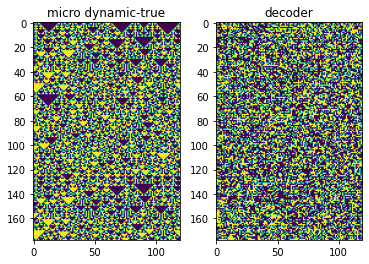

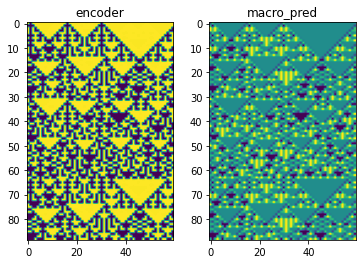

 19%|███████▏                              | 1901/10000 [08:59<52:19,  2.58it/s]

tensor([[0.9928, 0.0074],
        [0.0070, 0.0070]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 1., 0.],
        [0., 1., 0.],
        [0., 0., 0.]], grad_fn=<SelectBackward0>)


 19%|███████▎                              | 1921/10000 [09:04<40:19,  3.34it/s]

epoch: 1920/10000,train loss:10.74559,valid_loss:10.74911594


 19%|███████▍                              | 1941/10000 [09:10<40:17,  3.33it/s]

epoch: 1940/10000,train loss:10.74755,valid_loss:10.73601818


 20%|███████▍                              | 1961/10000 [09:16<40:51,  3.28it/s]

epoch: 1960/10000,train loss:10.73954,valid_loss:10.71618366
save


 20%|███████▌                              | 1981/10000 [09:22<40:38,  3.29it/s]

epoch: 1980/10000,train loss:10.73810,valid_loss:10.74685192


 20%|███████▌                              | 2000/10000 [09:27<39:39,  3.36it/s]

epoch: 2000/10000,train loss:10.72191,valid_loss:10.72534657


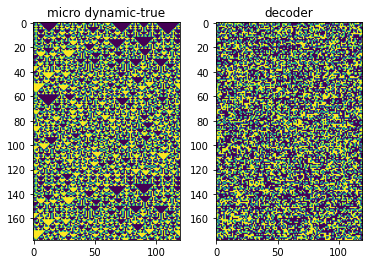

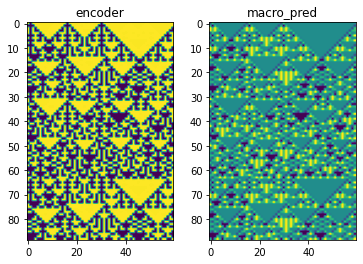

 20%|███████▌                              | 2001/10000 [09:28<56:37,  2.35it/s]

tensor([[0.9935, 0.0068],
        [0.0066, 0.0066]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [1., 1., 0.],
        [0., 0., 0.]], grad_fn=<SelectBackward0>)


 20%|███████▋                              | 2021/10000 [09:34<42:55,  3.10it/s]

epoch: 2020/10000,train loss:10.71972,valid_loss:10.72135735


 20%|███████▊                              | 2041/10000 [09:41<41:54,  3.17it/s]

epoch: 2040/10000,train loss:10.71854,valid_loss:10.72195148


 21%|███████▊                              | 2061/10000 [09:47<56:54,  2.32it/s]

epoch: 2060/10000,train loss:10.71563,valid_loss:10.72011662


 21%|███████▉                              | 2081/10000 [09:54<40:49,  3.23it/s]

epoch: 2080/10000,train loss:10.70751,valid_loss:10.69376087
save


 21%|███████▉                              | 2100/10000 [10:00<37:50,  3.48it/s]

epoch: 2100/10000,train loss:10.71036,valid_loss:10.72949600


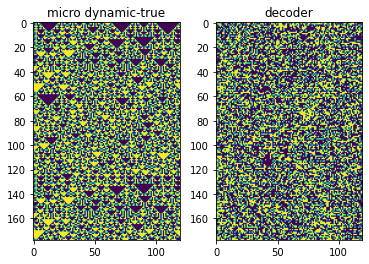

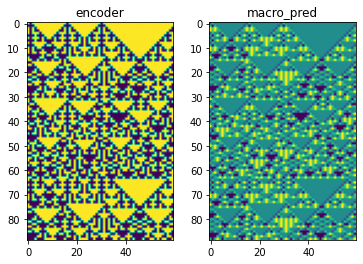

 21%|███████▉                              | 2101/10000 [10:00<52:02,  2.53it/s]

tensor([[0.9940, 0.0064],
        [0.0062, 0.0062]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [0., 1., 1.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 21%|████████                              | 2121/10000 [10:06<39:39,  3.31it/s]

epoch: 2120/10000,train loss:10.69876,valid_loss:10.69904232


 21%|████████▏                             | 2141/10000 [10:12<39:29,  3.32it/s]

epoch: 2140/10000,train loss:10.70344,valid_loss:10.71224880


 22%|████████▏                             | 2161/10000 [10:18<39:42,  3.29it/s]

epoch: 2160/10000,train loss:10.68798,valid_loss:10.69246769
save


 22%|████████▎                             | 2181/10000 [10:23<39:17,  3.32it/s]

epoch: 2180/10000,train loss:10.67130,valid_loss:10.64983273
save


 22%|████████▎                             | 2200/10000 [10:29<36:37,  3.55it/s]

epoch: 2200/10000,train loss:10.69114,valid_loss:10.70524120


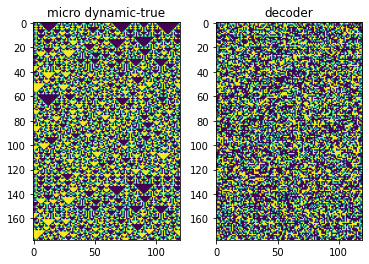

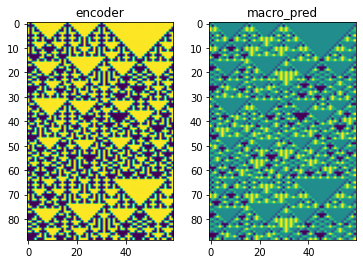

 22%|████████▎                             | 2201/10000 [10:29<48:58,  2.65it/s]

tensor([[0.9943, 0.0061],
        [0.0059, 0.0059]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 0., 0.],
        [1., 0., 1.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 22%|████████▍                             | 2221/10000 [10:35<38:56,  3.33it/s]

epoch: 2220/10000,train loss:10.67475,valid_loss:10.67036915


 22%|████████▌                             | 2241/10000 [10:41<38:43,  3.34it/s]

epoch: 2240/10000,train loss:10.65332,valid_loss:10.67387199


 23%|████████▌                             | 2261/10000 [10:47<39:13,  3.29it/s]

epoch: 2260/10000,train loss:10.66246,valid_loss:10.67484188


 23%|████████▋                             | 2281/10000 [10:53<42:05,  3.06it/s]

epoch: 2280/10000,train loss:10.63426,valid_loss:10.61296558
save


 23%|████████▋                             | 2300/10000 [10:59<36:51,  3.48it/s]

epoch: 2300/10000,train loss:10.61236,valid_loss:10.61264324
save


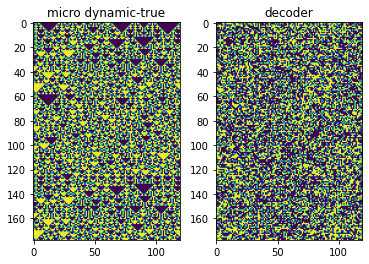

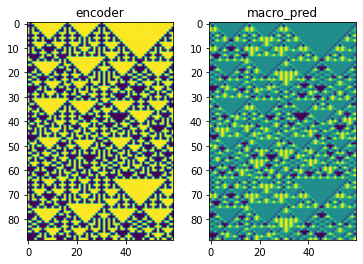

 23%|████████▋                             | 2301/10000 [10:59<50:27,  2.54it/s]

tensor([[0.9964, 0.0200],
        [0.0138, 0.0138]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 0., 0.],
        [1., 0., 0.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 23%|████████▊                             | 2321/10000 [11:06<39:22,  3.25it/s]

epoch: 2320/10000,train loss:10.63268,valid_loss:10.60994720
save


 23%|████████▉                             | 2341/10000 [11:11<39:01,  3.27it/s]

epoch: 2340/10000,train loss:10.63744,valid_loss:10.60293961
save


 24%|████████▉                             | 2361/10000 [11:17<38:36,  3.30it/s]

epoch: 2360/10000,train loss:10.62878,valid_loss:10.58251286
save


 24%|█████████                             | 2381/10000 [11:23<38:03,  3.34it/s]

epoch: 2380/10000,train loss:10.61932,valid_loss:10.55793571
save


 24%|█████████                             | 2400/10000 [11:28<35:51,  3.53it/s]

epoch: 2400/10000,train loss:10.61909,valid_loss:10.53831482
save


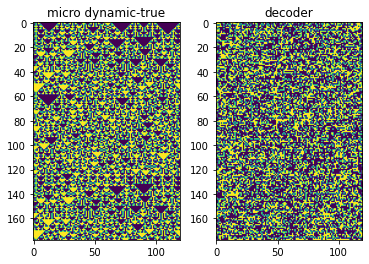

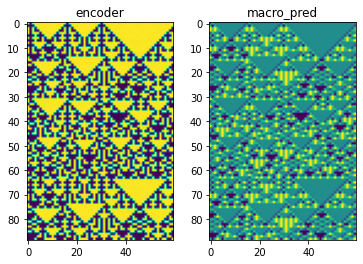

 24%|█████████                             | 2401/10000 [11:29<48:27,  2.61it/s]

tensor([[0.9968, 0.1140],
        [0.1129, 0.1129]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 1., 1.],
        [1., 1., 1.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


 24%|█████████▏                            | 2421/10000 [11:35<38:42,  3.26it/s]

epoch: 2420/10000,train loss:10.58014,valid_loss:10.54580688


 24%|█████████▎                            | 2441/10000 [11:42<40:23,  3.12it/s]

epoch: 2440/10000,train loss:10.56271,valid_loss:10.52877617
save


 25%|█████████▎                            | 2461/10000 [11:47<37:03,  3.39it/s]

epoch: 2460/10000,train loss:10.58384,valid_loss:10.49810600
save


 25%|█████████▍                            | 2481/10000 [11:53<38:15,  3.28it/s]

epoch: 2480/10000,train loss:10.54861,valid_loss:10.47616959
save


 25%|█████████▌                            | 2500/10000 [11:58<35:45,  3.50it/s]

epoch: 2500/10000,train loss:10.53490,valid_loss:10.46937752
save


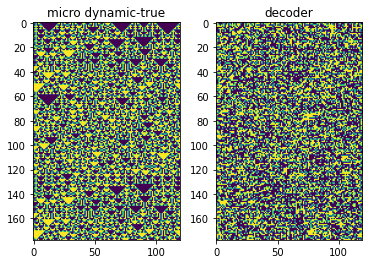

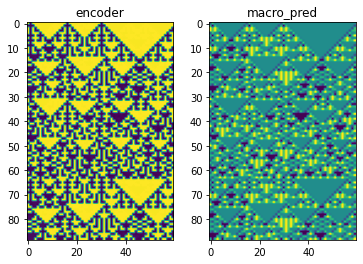

 25%|█████████▌                            | 2501/10000 [11:59<51:26,  2.43it/s]

tensor([[0.9971, 0.1474],
        [0.1472, 0.1472]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 1., 0.],
        [0., 1., 0.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


 25%|█████████▌                            | 2521/10000 [12:05<37:28,  3.33it/s]

epoch: 2520/10000,train loss:10.54753,valid_loss:10.47589874


 25%|█████████▋                            | 2541/10000 [12:11<37:58,  3.27it/s]

epoch: 2540/10000,train loss:10.52286,valid_loss:10.45008087
save


 26%|█████████▋                            | 2561/10000 [12:17<37:22,  3.32it/s]

epoch: 2560/10000,train loss:10.50722,valid_loss:10.42571831
save


 26%|█████████▊                            | 2581/10000 [12:22<37:01,  3.34it/s]

epoch: 2580/10000,train loss:10.50096,valid_loss:10.43870831


 26%|█████████▉                            | 2600/10000 [12:28<35:28,  3.48it/s]

epoch: 2600/10000,train loss:10.48487,valid_loss:10.39154625
save


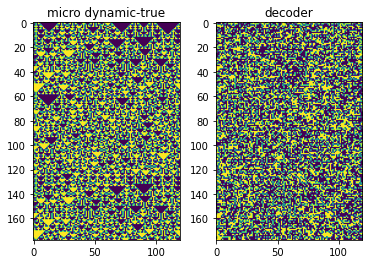

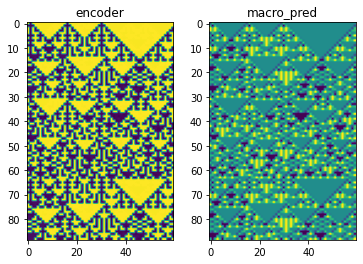

 26%|█████████▉                            | 2601/10000 [12:28<46:27,  2.65it/s]

tensor([[0.9972, 0.1643],
        [0.1659, 0.1659]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [1., 0., 0.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


 26%|█████████▉                            | 2621/10000 [12:35<37:38,  3.27it/s]

epoch: 2620/10000,train loss:10.47854,valid_loss:10.41488552


 26%|██████████                            | 2641/10000 [12:40<36:34,  3.35it/s]

epoch: 2640/10000,train loss:10.45824,valid_loss:10.38987637
save


 27%|██████████                            | 2661/10000 [12:46<36:45,  3.33it/s]

epoch: 2660/10000,train loss:10.47123,valid_loss:10.37230492
save


 27%|██████████▏                           | 2681/10000 [12:52<36:48,  3.31it/s]

epoch: 2680/10000,train loss:10.45906,valid_loss:10.36238670
save


 27%|██████████▎                           | 2700/10000 [12:57<34:50,  3.49it/s]

epoch: 2700/10000,train loss:10.45380,valid_loss:10.35570335
save


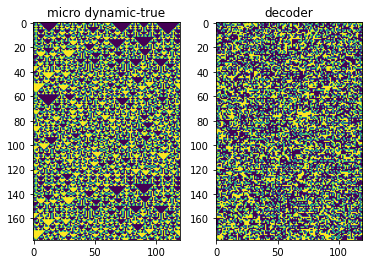

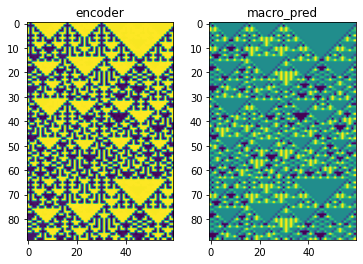

 27%|██████████▎                           | 2701/10000 [12:58<46:27,  2.62it/s]

tensor([[0.9974, 0.1804],
        [0.1783, 0.1783]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 0., 0.],
        [0., 1., 0.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 27%|██████████▎                           | 2721/10000 [13:04<36:51,  3.29it/s]

epoch: 2720/10000,train loss:10.43384,valid_loss:10.34260559
save


 27%|██████████▍                           | 2741/10000 [13:09<35:54,  3.37it/s]

epoch: 2740/10000,train loss:10.45606,valid_loss:10.32719135
save


 28%|██████████▍                           | 2761/10000 [13:15<36:23,  3.31it/s]

epoch: 2760/10000,train loss:10.42561,valid_loss:10.32110119
save


 28%|██████████▌                           | 2781/10000 [13:21<36:03,  3.34it/s]

epoch: 2780/10000,train loss:10.41817,valid_loss:10.34142113


 28%|██████████▋                           | 2800/10000 [13:26<33:51,  3.54it/s]

epoch: 2800/10000,train loss:10.43774,valid_loss:10.29140091
save


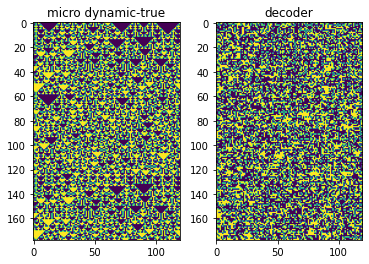

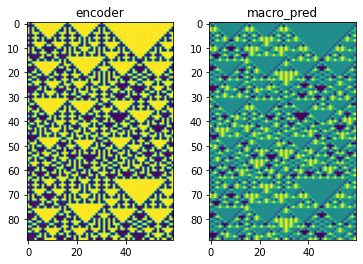

 28%|██████████▋                           | 2801/10000 [13:27<44:55,  2.67it/s]

tensor([[0.9975, 0.1904],
        [0.1896, 0.1896]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 1., 0.],
        [0., 1., 0.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 28%|██████████▋                           | 2821/10000 [13:33<37:10,  3.22it/s]

epoch: 2820/10000,train loss:10.42265,valid_loss:10.28369427
save


 28%|██████████▊                           | 2841/10000 [13:38<36:02,  3.31it/s]

epoch: 2840/10000,train loss:10.40596,valid_loss:10.31587219


 29%|██████████▊                           | 2861/10000 [13:44<39:25,  3.02it/s]

epoch: 2860/10000,train loss:10.38840,valid_loss:10.31037426


 29%|██████████▉                           | 2881/10000 [13:51<40:57,  2.90it/s]

epoch: 2880/10000,train loss:10.37268,valid_loss:10.27291393
save


 29%|███████████                           | 2900/10000 [13:57<34:15,  3.45it/s]

epoch: 2900/10000,train loss:10.39462,valid_loss:10.28978443


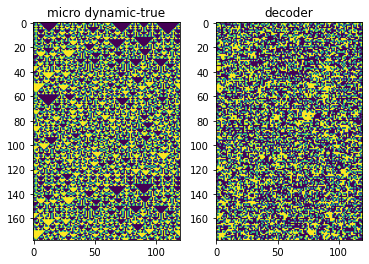

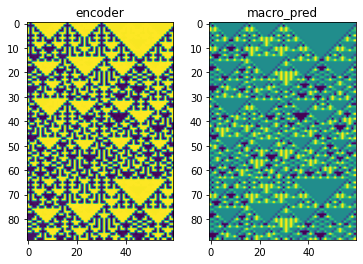

 29%|███████████                           | 2901/10000 [13:57<45:32,  2.60it/s]

tensor([[0.9975, 0.1968],
        [0.1961, 0.1961]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 0., 0.],
        [1., 1., 1.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 29%|███████████                           | 2921/10000 [14:04<36:23,  3.24it/s]

epoch: 2920/10000,train loss:10.37354,valid_loss:10.26752377
save


 29%|███████████▏                          | 2941/10000 [14:10<40:01,  2.94it/s]

epoch: 2940/10000,train loss:10.38774,valid_loss:10.26358986
save


 30%|███████████▎                          | 2961/10000 [14:16<36:51,  3.18it/s]

epoch: 2960/10000,train loss:10.37595,valid_loss:10.27075863


 30%|███████████▎                          | 2981/10000 [14:22<35:22,  3.31it/s]

epoch: 2980/10000,train loss:10.34902,valid_loss:10.27075768


 30%|███████████▍                          | 3000/10000 [14:27<36:13,  3.22it/s]

epoch: 3000/10000,train loss:10.36465,valid_loss:10.26881790


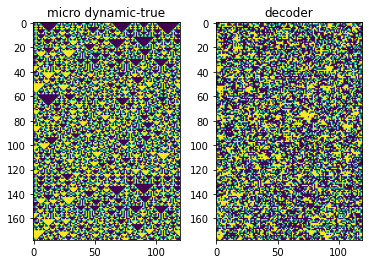

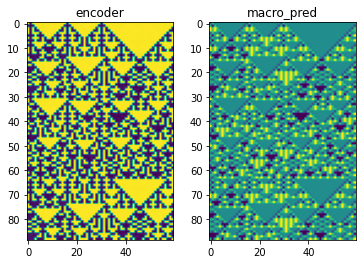

 30%|███████████▍                          | 3001/10000 [14:28<50:54,  2.29it/s]

tensor([[0.9976, 0.2041],
        [0.2023, 0.2023]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [0., 0., 0.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 30%|███████████▍                          | 3021/10000 [14:34<52:44,  2.21it/s]

epoch: 3020/10000,train loss:10.34677,valid_loss:10.22494411
save


 30%|███████████▌                          | 3041/10000 [14:40<34:02,  3.41it/s]

epoch: 3040/10000,train loss:10.36368,valid_loss:10.24488544


 31%|███████████▋                          | 3061/10000 [14:46<35:07,  3.29it/s]

epoch: 3060/10000,train loss:10.33779,valid_loss:10.21702003
save


 31%|███████████▋                          | 3081/10000 [14:51<33:06,  3.48it/s]

epoch: 3080/10000,train loss:10.34401,valid_loss:10.19907188
save


 31%|███████████▊                          | 3100/10000 [14:56<31:53,  3.61it/s]

epoch: 3100/10000,train loss:10.32322,valid_loss:10.23232841


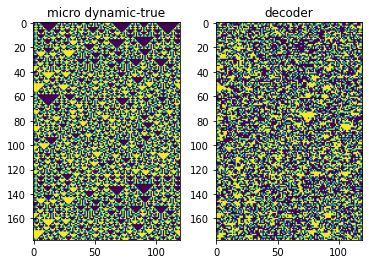

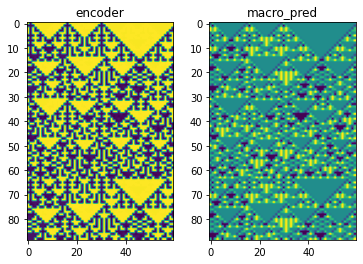

 31%|███████████▊                          | 3101/10000 [14:57<42:56,  2.68it/s]

tensor([[0.9977, 0.2104],
        [0.2065, 0.2065]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [0., 1., 0.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 31%|███████████▊                          | 3121/10000 [15:02<31:49,  3.60it/s]

epoch: 3120/10000,train loss:10.33590,valid_loss:10.19955635


 31%|███████████▉                          | 3141/10000 [15:08<32:32,  3.51it/s]

epoch: 3140/10000,train loss:10.34539,valid_loss:10.21831322


 32%|████████████                          | 3161/10000 [15:13<31:05,  3.67it/s]

epoch: 3160/10000,train loss:10.31390,valid_loss:10.20182037


 32%|████████████                          | 3181/10000 [15:18<31:14,  3.64it/s]

epoch: 3180/10000,train loss:10.30511,valid_loss:10.18290234
save


 32%|████████████▏                         | 3200/10000 [15:23<29:43,  3.81it/s]

epoch: 3200/10000,train loss:10.31167,valid_loss:10.18079948
save


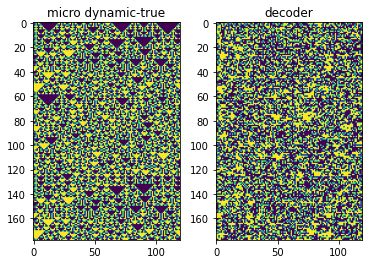

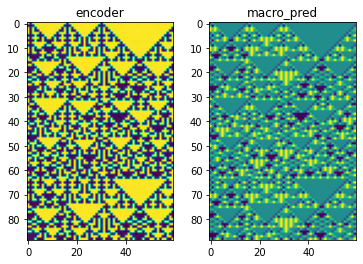

 32%|████████████▏                         | 3201/10000 [15:24<40:23,  2.81it/s]

tensor([[0.9977, 0.2117],
        [0.2100, 0.2100]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [0., 1., 0.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 32%|████████████▏                         | 3221/10000 [15:29<31:03,  3.64it/s]

epoch: 3220/10000,train loss:10.31283,valid_loss:10.21653557


 32%|████████████▎                         | 3241/10000 [15:35<32:58,  3.42it/s]

epoch: 3240/10000,train loss:10.30245,valid_loss:10.16824245
save


 33%|████████████▍                         | 3261/10000 [15:40<30:46,  3.65it/s]

epoch: 3260/10000,train loss:10.29875,valid_loss:10.18047619


 33%|████████████▍                         | 3281/10000 [15:45<30:47,  3.64it/s]

epoch: 3280/10000,train loss:10.29050,valid_loss:10.17638016


 33%|████████████▌                         | 3300/10000 [15:50<29:13,  3.82it/s]

epoch: 3300/10000,train loss:10.28048,valid_loss:10.16236687
save


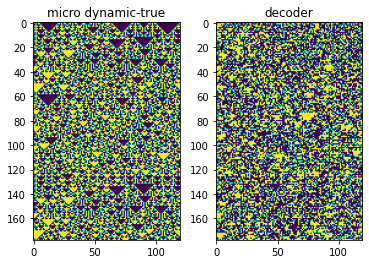

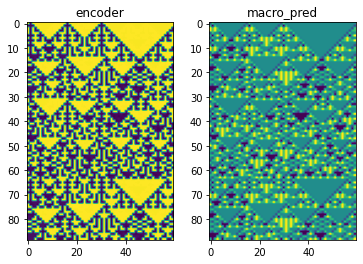

 33%|████████████▌                         | 3301/10000 [15:51<39:04,  2.86it/s]

tensor([[0.9977, 0.2152],
        [0.2130, 0.2130]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [0., 1., 1.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


 33%|████████████▌                         | 3321/10000 [15:56<30:35,  3.64it/s]

epoch: 3320/10000,train loss:10.28899,valid_loss:10.16371346


 33%|████████████▋                         | 3341/10000 [16:01<30:49,  3.60it/s]

epoch: 3340/10000,train loss:10.26982,valid_loss:10.14899921
save


 34%|████████████▊                         | 3361/10000 [16:07<30:33,  3.62it/s]

epoch: 3360/10000,train loss:10.28141,valid_loss:10.14592743
save


 34%|████████████▊                         | 3381/10000 [16:12<30:04,  3.67it/s]

epoch: 3380/10000,train loss:10.28574,valid_loss:10.16215038


 34%|████████████▉                         | 3400/10000 [16:17<28:37,  3.84it/s]

epoch: 3400/10000,train loss:10.27602,valid_loss:10.14188480
save


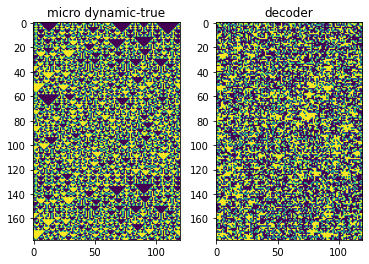

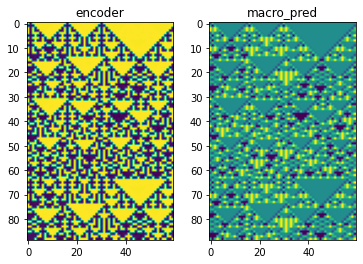

 34%|████████████▉                         | 3401/10000 [16:17<38:04,  2.89it/s]

tensor([[0.9978, 0.2179],
        [0.2161, 0.2161]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 1., 0.],
        [1., 1., 1.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 34%|████████████▉                         | 3421/10000 [16:23<29:55,  3.66it/s]

epoch: 3420/10000,train loss:10.26397,valid_loss:10.15509033


 34%|█████████████                         | 3441/10000 [16:28<29:52,  3.66it/s]

epoch: 3440/10000,train loss:10.24940,valid_loss:10.14166737
save


 35%|█████████████▏                        | 3461/10000 [16:33<29:42,  3.67it/s]

epoch: 3460/10000,train loss:10.26982,valid_loss:10.15390301


 35%|█████████████▏                        | 3481/10000 [16:38<29:39,  3.66it/s]

epoch: 3480/10000,train loss:10.25888,valid_loss:10.10663509
save


 35%|█████████████▎                        | 3500/10000 [16:43<27:49,  3.89it/s]

epoch: 3500/10000,train loss:10.25498,valid_loss:10.12641525


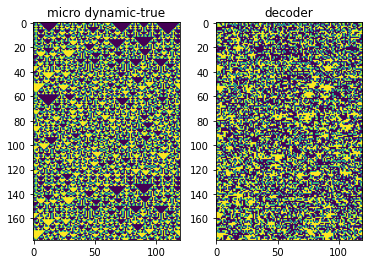

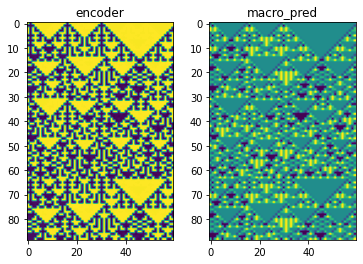

 35%|█████████████▎                        | 3501/10000 [16:44<40:08,  2.70it/s]

tensor([[0.9978, 0.2204],
        [0.2187, 0.2187]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [0., 1., 1.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


 35%|█████████████▍                        | 3521/10000 [16:49<29:47,  3.63it/s]

epoch: 3520/10000,train loss:10.25168,valid_loss:10.12485218


 35%|█████████████▍                        | 3541/10000 [16:54<29:19,  3.67it/s]

epoch: 3540/10000,train loss:10.24381,valid_loss:10.11574459


 36%|█████████████▌                        | 3561/10000 [17:00<29:10,  3.68it/s]

epoch: 3560/10000,train loss:10.23989,valid_loss:10.12911034


 36%|█████████████▌                        | 3581/10000 [17:05<28:43,  3.73it/s]

epoch: 3580/10000,train loss:10.24199,valid_loss:10.11240196


 36%|█████████████▋                        | 3600/10000 [17:10<27:19,  3.90it/s]

epoch: 3600/10000,train loss:10.24282,valid_loss:10.13374519


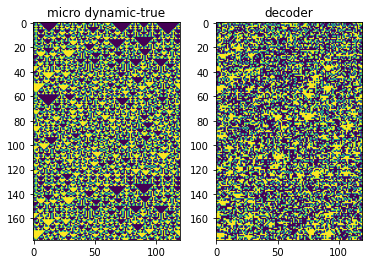

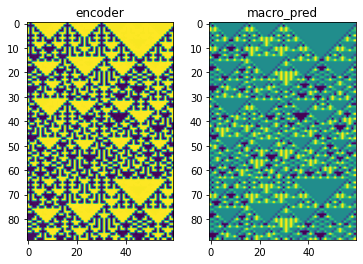

 36%|█████████████▋                        | 3601/10000 [17:10<36:36,  2.91it/s]

tensor([[0.9979, 0.2229],
        [0.2210, 0.2210]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [1., 0., 1.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 36%|█████████████▊                        | 3621/10000 [17:15<28:53,  3.68it/s]

epoch: 3620/10000,train loss:10.24011,valid_loss:10.10021973
save


 36%|█████████████▊                        | 3641/10000 [17:21<28:52,  3.67it/s]

epoch: 3640/10000,train loss:10.24415,valid_loss:10.12043190


 37%|█████████████▉                        | 3661/10000 [17:26<29:50,  3.54it/s]

epoch: 3660/10000,train loss:10.24217,valid_loss:10.11671352


 37%|█████████████▉                        | 3681/10000 [17:32<34:19,  3.07it/s]

epoch: 3680/10000,train loss:10.23447,valid_loss:10.11288643


 37%|██████████████                        | 3700/10000 [17:37<27:26,  3.83it/s]

epoch: 3700/10000,train loss:10.22482,valid_loss:10.08733749
save


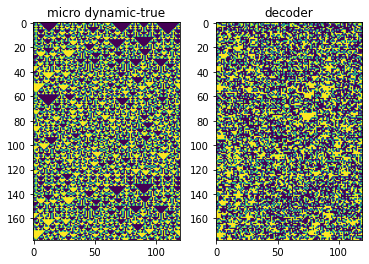

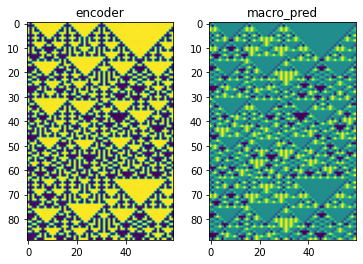

 37%|██████████████                        | 3701/10000 [17:37<36:47,  2.85it/s]

tensor([[0.9979, 0.2225],
        [0.2212, 0.2212]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 0., 0.],
        [0., 1., 0.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


 37%|██████████████▏                       | 3721/10000 [17:43<29:31,  3.54it/s]

epoch: 3720/10000,train loss:10.22369,valid_loss:10.07796001
save


 37%|██████████████▏                       | 3741/10000 [17:48<28:52,  3.61it/s]

epoch: 3740/10000,train loss:10.22564,valid_loss:10.10555553


 38%|██████████████▎                       | 3761/10000 [17:53<28:36,  3.64it/s]

epoch: 3760/10000,train loss:10.22877,valid_loss:10.09924984


 38%|██████████████▎                       | 3781/10000 [17:59<30:36,  3.39it/s]

epoch: 3780/10000,train loss:10.20951,valid_loss:10.10334587


 38%|██████████████▍                       | 3800/10000 [18:04<31:01,  3.33it/s]

epoch: 3800/10000,train loss:10.20965,valid_loss:10.06852722
save


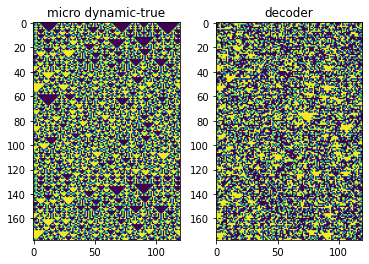

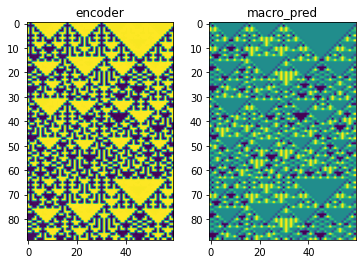

 38%|██████████████▍                       | 3801/10000 [18:05<42:41,  2.42it/s]

tensor([[0.9979, 0.2233],
        [0.2224, 0.2224]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[1., 1., 0.],
        [0., 0., 0.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 38%|██████████████▌                       | 3821/10000 [18:10<29:27,  3.50it/s]

epoch: 3820/10000,train loss:10.22293,valid_loss:10.09014130


 38%|██████████████▌                       | 3841/10000 [18:16<29:42,  3.46it/s]

epoch: 3840/10000,train loss:10.19524,valid_loss:10.10895252


 39%|██████████████▋                       | 3861/10000 [18:21<30:05,  3.40it/s]

epoch: 3860/10000,train loss:10.21957,valid_loss:10.10318470


 39%|██████████████▋                       | 3881/10000 [18:27<30:08,  3.38it/s]

epoch: 3880/10000,train loss:10.20412,valid_loss:10.07472610


 39%|██████████████▊                       | 3900/10000 [18:33<27:58,  3.63it/s]

epoch: 3900/10000,train loss:10.20500,valid_loss:10.05693913
save


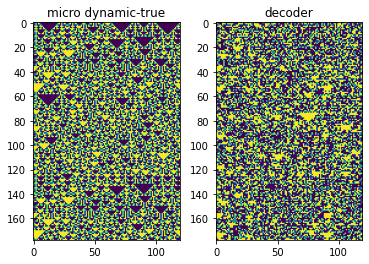

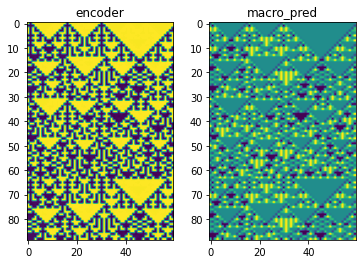

 39%|██████████████▊                       | 3901/10000 [18:33<38:15,  2.66it/s]

tensor([[0.9979, 0.2236],
        [0.2219, 0.2219]], grad_fn=<SelectBackward0>) tensor([[0.2434, 0.6529],
        [0.5910, 0.0462]], grad_fn=<SliceBackward0>)
tensor([[1., 0., 1.],
        [1., 0., 1.],
        [0., 0., 1.]]) tensor([[0., 0., 0.],
        [0., 1., 0.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 39%|██████████████▉                       | 3921/10000 [18:39<29:06,  3.48it/s]

epoch: 3920/10000,train loss:10.21803,valid_loss:10.07165337


 39%|██████████████▉                       | 3941/10000 [18:44<28:38,  3.53it/s]

epoch: 3940/10000,train loss:10.19990,valid_loss:10.09418201


 40%|███████████████                       | 3958/10000 [18:49<28:01,  3.59it/s]

In [ ]:

loss_F2 = torch.nn.KLDivLoss(reduction='batchmean')
loss_F1 = torch.nn.NLLLoss()
loss_F3 = torch.nn.MSELoss()
num_epochs = 10000


torch.manual_seed(seed)
random.seed(seed)
renorm = RenormNet(hidden_size,group_size=group_size)
renorm = renorm.cuda() if use_cuda else renorm
init_weight(renorm)
optimizer2 = optim.Adam(renorm.parameters(), lr=1e-3, weight_decay=5e-4)
train_losses = []
valid_losses = []
last_valid_loss = 10000
count = 0
dynamic.eval()
for epoch in tqdm(range(num_epochs)):
    renorm.train()
    t_loss = []
    for train_x, train_y in train_loader:
        if use_cuda:
            train_x = train_x.cuda()
            train_y = train_y.cuda()
        encoder1 = renorm.Encoder(train_x)[:,:,:,1]
        b,t,s = encoder1.shape
        macro_pred = dynamic(encoder1.reshape(-1,s))[:,:,1].reshape(b,t,s)
        decoder2 = renorm.Decoder(macro_pred)
        b,t,s,_ = decoder2.shape
        loss = loss_F1(torch.log(decoder2.view(-1,2)+NEAR_ZERO), train_y.view(-1).long())
        t_loss.append(loss.item())
        optimizer2.zero_grad()
        loss.backward()
        optimizer2.step()
    train_losses.append(np.mean(t_loss))
    if epoch % 20 == 0:
        renorm.eval()
        v_loss = []
        loss1s = []
        loss2s = []
        loss3s = []
        for valid_x, valid_y in valid_loader:
            if use_cuda:
                valid_x = valid_x.cuda()
                valid_y = valid_y.cuda()
            encoder1 = renorm.Encoder(valid_x)
            b,t,s,_ = encoder1.shape
            preds1 = torch.tensor(encoder1.max(3)[1],dtype=torch.float)

            macro_pred = dynamic(preds1.reshape(-1,s))[:,:,1].reshape(b,t,s)
            decoder2 = renorm.Decoder(macro_pred)#b*n*2
            b,t,s,_ = decoder2.shape
            loss = loss_F1(torch.log(decoder2.view(-1,2)+NEAR_ZERO), valid_y.view(-1).long())
            v_loss.append(loss.item())
        valid_losses.append(np.mean(v_loss))
        
        print(f'epoch: {epoch}/{num_epochs},train loss:{np.mean(t_loss):.5f},valid_loss:{np.mean(v_loss):.8f}')
        if np.mean(v_loss) >= last_valid_loss:
            count += 1
            if count > 30:
                break
        if np.mean(v_loss) < last_valid_loss:
            count = 0
            print('save')
            models = {
                'dynamic':dynamic,
                'renorm':renorm
            }
#             torch.save(models, f'./models/new_{rule}_model_group_size={group_size}_{seed}.pth')
            last_valid_loss = np.mean(v_loss)
        if epoch % 100 == 0:
            plt.figure()
            plt.subplot(122)
            plt.title('decoder')
            plt.imshow(decoder2.cpu().detach().numpy()[0,:,:,1])
            plt.subplot(121)
            plt.title('micro dynamic-true')
            plt.imshow(valid_y[0,:,:].cpu().detach().numpy())
            plt.show()

            plt.figure()
            plt.subplot(121)
            plt.title('encoder')
            plt.imshow(encoder1[0,:,:,1].cpu().detach().numpy())
            plt.subplot(122)
            plt.title('macro_pred')
            plt.imshow(macro_pred[0,:,:].cpu().detach().numpy())
            plt.show()
            print(encoder1[0,:2,:2,1],macro_pred[0,:2,:2])
            print(valid_y[0,:3,:3],decoder2[0,:3,:3,1])
        

In [ ]:
plt.plot(train_losses,label='train_loss')
plt.plot(np.arange(0,len(train_losses),20),valid_losses,label='valid_loss')
plt.legend()
# with open(f'./data/loss_self_{rule}_{seed}.pkl','wb') as f:
#     pkl.dump({
#         'train':train_losses,
#         'valid':valid_losses
#     },f)